# Enunciado

Faça uma análise de cada dataset antes de mais nada, verificando:
- Características gerais
- Se tem campos nulos

Uma vez feito isso, faça para cada dataset:
- Determinar o número de clusters usando o método do elbow: escrever um texto com o valor em função do que foi exibido no gráfico.
- Treinar o modelo com kmeans:
kmeans = KMeans(n_clusters = ???, init = 'k-means++', n_init = 10, max_iter=300)
testar com init com o parâmetro random e com k-means++, e cada um com 300 iterações e 1000 iterações.
- Lembrar de gerar o cluster de cada instância:
X['cluster'] = pd.DataFrame(y_kmeans)

- Para cada teste, fazer um plot usando a feature x1 para eixo x, e a feature x2 para o eixo y conforme abaixo. Plotar também os cntróides.

#%matplolib notebook
#c color em funao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(X['x1'], X['x2'], s = 10, c = X['cluster'])
plt.scatter(centroids3[:, 0], centroids3[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

E finalmente, você com um ótimo cientista de dados, deve pesquisar como validar a eficácia do kmeans ao determinar o cluster de cada instância. Para tal, procure no google exemplos dos seguintes métodos e depois aplique para cada teste feito.

- silhouette_score
- calinski_harabasz_score
- davies_bouldin_score

Com os coeficientes de cada teste avalie (escrever uma justificativa) a eficácia da classificação feita pelo kmeans.

Ordem dos testes: determinar o número de clusters, executar o kmeans, determinar o cluster de cada instância, plotar, verificar a acurácia.
Para dataset 1:
1) random com 300 iterações:
2) random com 1000 iterações
3) kmeans++ com 300 iterações
4) kmeans++ com 1000 iterações

Para dataset 2:
1) random com 300 iterações:
2) random com 1000 iterações
3) kmeans++ com 300 iterações
4) kmeans++ com 1000 iterações

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


In [2]:
#Impotando dataset 1
df1 = pd.read_csv('Dataset/dataset_1.csv', sep=';')
#Examinando Data Type
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18500 entries, 0 to 18499
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      18500 non-null  float64
 1   x2      18500 non-null  float64
 2   x3      18500 non-null  float64
 3   x4      18500 non-null  float64
 4   x5      18500 non-null  float64
 5   x6      18500 non-null  float64
 6   x7      18500 non-null  float64
 7   x8      18500 non-null  float64
 8   x9      18500 non-null  float64
 9   x10     18500 non-null  float64
 10  x11     18500 non-null  float64
 11  x12     18500 non-null  float64
dtypes: float64(12)
memory usage: 1.7 MB


In [3]:
#Verificando os primeiros 5 registros
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675


In [4]:
#Verificando valores nulos
df1.isna().sum()

X1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
dtype: int64

In [5]:
#Examinando características gerais do dados
df1.describe()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
count,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000
mean,0.479316,0.401101,-0.036613,0.115756,-0.067300,-0.050764,-0.356024,1.258355,-1.014831,-0.419818,-0.292423,-1.619202
std,6.162037,5.936852,5.929547,5.288724,6.450516,5.489512,5.701534,5.882630,6.187764,6.374784,5.910394,5.935993
min,-12.562877,-12.845130,-13.184632,-12.684910,-13.220067,-12.976295,-13.168605,-11.877164,-12.944935,-12.986817,-12.595942,-12.920032
25%,-4.163954,-4.969523,-5.410800,-3.845578,-5.982486,-4.613177,-5.641036,-4.064888,-6.869708,-6.034305,-4.583072,-6.524806
50%,0.246958,2.038327,0.719043,0.942982,0.129550,0.092994,-0.203821,1.712891,-1.486036,-0.639076,-1.030882,-2.586011
75%,6.534062,5.094108,4.827765,4.285728,5.821847,4.081665,3.813254,6.672852,4.271135,5.006888,4.065448,2.599988
max,11.706389,12.152035,12.156041,11.984369,12.624881,12.034950,12.643021,12.347370,12.334277,13.073007,12.721117,12.397334


# Definindo o número de Cluster utilizando o método Elbow
## Dataset 1
###  1) random

1 7849104.252696779


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2 6857375.197745966


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


3 6195996.206903491
4 5640018.11617871


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


5 5154976.8250418585
6 4793309.130447397


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


7 4454271.474987357
8 4092928.01224434


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 3960430.8186213416
10 3497332.530241902


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


11 3283153.2522095526
12 3190472.86978703
13 3066501.023169005


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


14 2787052.6181724835
15 2637956.573537001


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 2397611.90653116
17 2321394.130809279


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


18 2160081.0484244656
19 2005229.0824189705


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


20 1841831.484817665
21 1797364.321526094


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


22 1680334.1884452053
23 1557783.9958810313


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


24 1414177.7428019214
25 1307257.3727586986


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


26 1252060.9862023767


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 1128424.9479126604
28 1120635.2587003026


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 1014769.846580263


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


30 1003549.9676322995


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


31 764863.4622013824


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


32 869341.295560061


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


33 671516.1450885921


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


34 627387.763507058


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


35 874691.8217965858


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


36 580027.1189197688


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


37 600112.7541025484


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


38 513382.3763498195


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


39 643925.3040962324


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


40 535082.8459785572


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


41 548553.2652467932


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


42 408418.2239590346


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


43 364707.2455171401


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


44 269004.7209785988


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


45 320784.21235057054


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


46 397785.8390442997


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


47 374620.2530557244


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


48 267282.12580049183


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


49 300116.4213271605


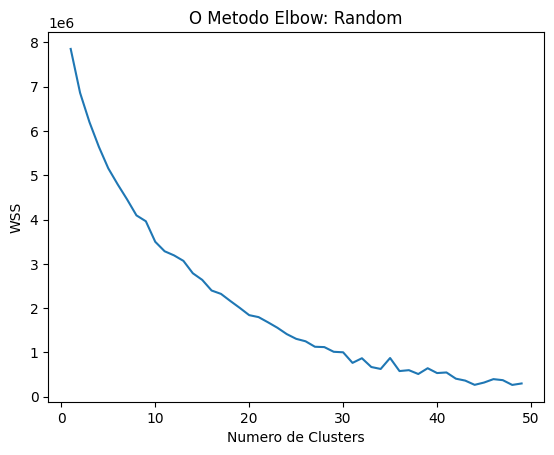

In [6]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_random = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 50):
    kmeans1_1 = KMeans(n_clusters = i, init = 'random')
    kmeans1_1.fit(df1)
    print (i,kmeans1_1.inertia_)
    wcss_random.append(kmeans1_1.inertia_)

plt.plot(range(1, 50),wcss_random)
plt.title('O Metodo Elbow: Random')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

In [7]:
display(wcss_random)

[7849104.252696779,
 6857375.197745966,
 6195996.206903491,
 5640018.11617871,
 5154976.8250418585,
 4793309.130447397,
 4454271.474987357,
 4092928.01224434,
 3960430.8186213416,
 3497332.530241902,
 3283153.2522095526,
 3190472.86978703,
 3066501.023169005,
 2787052.6181724835,
 2637956.573537001,
 2397611.90653116,
 2321394.130809279,
 2160081.0484244656,
 2005229.0824189705,
 1841831.484817665,
 1797364.321526094,
 1680334.1884452053,
 1557783.9958810313,
 1414177.7428019214,
 1307257.3727586986,
 1252060.9862023767,
 1128424.9479126604,
 1120635.2587003026,
 1014769.846580263,
 1003549.9676322995,
 764863.4622013824,
 869341.295560061,
 671516.1450885921,
 627387.763507058,
 874691.8217965858,
 580027.1189197688,
 600112.7541025484,
 513382.3763498195,
 643925.3040962324,
 535082.8459785572,
 548553.2652467932,
 408418.2239590346,
 364707.2455171401,
 269004.7209785988,
 320784.21235057054,
 397785.8390442997,
 374620.2530557244,
 267282.12580049183,
 300116.4213271605]

9 CLUSTERS???

### 2) Kmeans++

/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


1 7849104.252696779


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2 6857344.801672969


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


3 6188818.679618459


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


4 5623916.232791452


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


5 5132429.772695378


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


6 4815751.21316948


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


7 4487305.742043165


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


8 4134456.8113677315


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 3768358.316045952


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


10 3544007.5475470377


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


11 3313445.839695464


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


12 3116850.6753025716


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


13 2814768.5819565267


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


14 2648338.5449932194


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


15 2424842.4349223254


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 2229490.6891608154


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


17 2099871.6680697436


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


18 1953521.593835461


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


19 1795164.1174107147


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


20 1676876.566295473


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


21 1579265.6134664738


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


22 1425899.4803969848


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


23 1332276.9203879172


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


24 1194127.4026851929


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


25 1108429.672818538


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


26 1001949.404569653


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 896930.4754907163


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


28 785115.914456703


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 700737.9819296942


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


30 626152.2201014651


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


31 552508.2914980485


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


32 486538.03520797635


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


33 427969.21018037066


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


34 371440.42268073786


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


35 320720.1544330652


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


36 270402.1702167701


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


37 221435.21622272927


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


38 220975.0302604525


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


39 220585.07888637387


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


40 220151.16864737184


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


41 219729.06414647884


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


42 219316.22735898523


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


43 218933.57557936892


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


44 218539.28381561674


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


45 218120.283381256


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


46 217685.31598804914


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


47 217238.91961073776


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


48 216840.8207454532


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


49 216448.04302668673


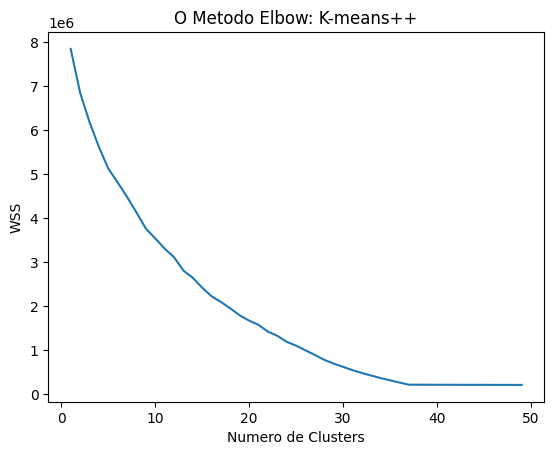

In [8]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_kmeans = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 50):
    kmeans1_2 = KMeans(n_clusters = i, init = 'k-means++')
    kmeans1_2.fit(df1)
    print (i,kmeans1_2.inertia_)
    wcss_kmeans.append(kmeans1_2.inertia_)

plt.plot(range(1, 50), wcss_kmeans)
plt.title('O Metodo Elbow: K-means++')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

In [9]:
display(wcss_kmeans)

[7849104.252696779,
 6857344.801672969,
 6188818.679618459,
 5623916.232791452,
 5132429.772695378,
 4815751.21316948,
 4487305.742043165,
 4134456.8113677315,
 3768358.316045952,
 3544007.5475470377,
 3313445.839695464,
 3116850.6753025716,
 2814768.5819565267,
 2648338.5449932194,
 2424842.4349223254,
 2229490.6891608154,
 2099871.6680697436,
 1953521.593835461,
 1795164.1174107147,
 1676876.566295473,
 1579265.6134664738,
 1425899.4803969848,
 1332276.9203879172,
 1194127.4026851929,
 1108429.672818538,
 1001949.404569653,
 896930.4754907163,
 785115.914456703,
 700737.9819296942,
 626152.2201014651,
 552508.2914980485,
 486538.03520797635,
 427969.21018037066,
 371440.42268073786,
 320720.1544330652,
 270402.1702167701,
 221435.21622272927,
 220975.0302604525,
 220585.07888637387,
 220151.16864737184,
 219729.06414647884,
 219316.22735898523,
 218933.57557936892,
 218539.28381561674,
 218120.283381256,
 217685.31598804914,
 217238.91961073776,
 216840.8207454532,
 216448.0430266867

11 CLUSTERS??????

# Instânciando o Algoritmo K-means 
## Dataset 1
### 1) random com 300 iterações

In [10]:
kmeans_r1 = KMeans(n_clusters = 9, init = 'random', n_init = 10, max_iter=300)
kmeans_r1.fit(df1)

KMeans(init='random', n_clusters=9, n_init=10)

In [11]:
kmeans_r1.cluster_centers_

array([[-4.45117909,  4.6918304 , -7.334295  , -1.63240564,  4.40074699,
        -9.35309777,  4.18421734, -5.44775082, -8.17050326,  6.46023642,
         5.98314811,  6.84911932],
       [ 3.79647727, -2.80570954, -7.99673817, -2.70206845, -8.01095166,
        -0.63710549, -1.33955919,  1.94538006,  2.59516441, -6.38800603,
        -2.18663686,  0.57260574],
       [-7.01846784, -0.67444387,  1.21709744, -2.75769587,  4.76072609,
         0.35740172, -2.10187204,  0.53063275,  6.16617464, -2.8798009 ,
         2.83097298, -5.11846773],
       [-4.32658133, -0.87107038,  3.73747866,  2.28959597, -2.72106327,
        -2.62716889, -5.32869674,  0.71396905, -5.57665262,  2.27403451,
         5.49539947, -2.64494863],
       [-1.50642286, -3.77445317,  5.65167748,  4.64579524,  4.28709619,
         2.94373831,  5.8530454 ,  5.91936875, -4.57362439, -6.65565113,
        -8.44010278, -1.71726172],
       [ 6.3573028 ,  4.36671286, -3.75512065, -4.80470004,  4.73720684,
         7.03376147,  

In [12]:
labels = kmeans_r1.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_r1'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,5
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,2
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,2
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,2
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,8


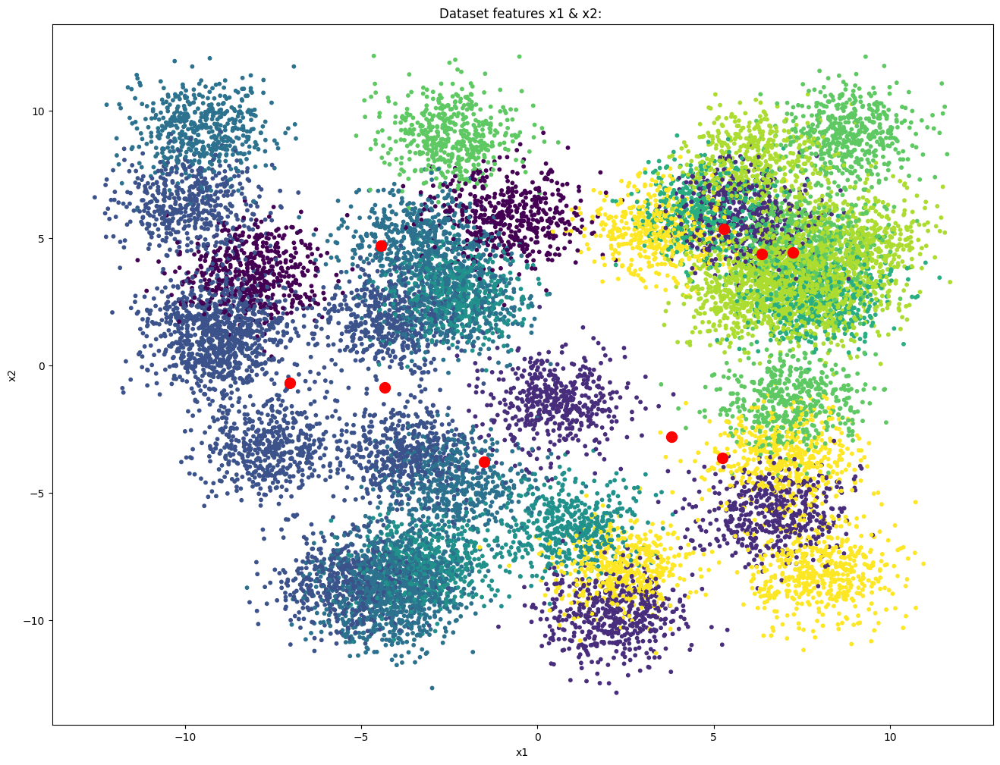

In [13]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_r1'])
plt.scatter(kmeans_r1.cluster_centers_[:, 0], kmeans_r1.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 


In [14]:
labels = kmeans_r1.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [15]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.2888
Calinski-Harabasz Score: 2457.7814
Davies-Bouldin Score: 1.4761


### 1) random com 1000 iterações

In [16]:
kmeans_r2 = KMeans(n_clusters = 9, init = 'random', n_init = 10, max_iter=1000)
kmeans_r2.fit(df1)

KMeans(init='random', max_iter=1000, n_clusters=9, n_init=10)

In [17]:
kmeans_r2.cluster_centers_

array([[ 3.79647727e+00, -2.80570954e+00, -7.99673817e+00,
        -2.70206845e+00, -8.01095166e+00, -6.37105493e-01,
        -1.33955919e+00,  1.94538006e+00,  2.59516441e+00,
        -6.38800603e+00, -2.18663686e+00,  5.72605738e-01,
         1.00000000e+00],
       [ 2.30020961e+00, -3.36297492e+00,  2.01680951e+00,
         3.96360424e+00,  5.26601042e+00,  3.65868998e+00,
         5.60508765e+00,  4.45292474e+00, -2.99557463e+00,
        -6.35982451e+00, -5.72856436e+00,  1.56879191e+00,
         5.00000000e+00],
       [-3.12174088e+00, -6.35248396e+00,  5.16575590e+00,
        -2.05689666e+00, -5.97480225e+00,  3.58451088e-01,
        -8.30687999e+00,  7.10881955e+00, -6.64998997e+00,
         6.47019987e+00,  8.83686752e-01, -2.82703014e+00,
         3.00000000e+00],
       [ 7.36790743e+00,  4.90051266e+00,  2.60277523e+00,
        -1.85078451e+00, -5.20143243e+00,  2.07495701e+00,
         9.74520280e-01,  5.60404329e+00,  1.89359155e-01,
         5.17983636e+00, -1.01871279e

In [18]:
labels = kmeans_r2.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_r2'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,5,1
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,2,6
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,2,4
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,2,6
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,8,5


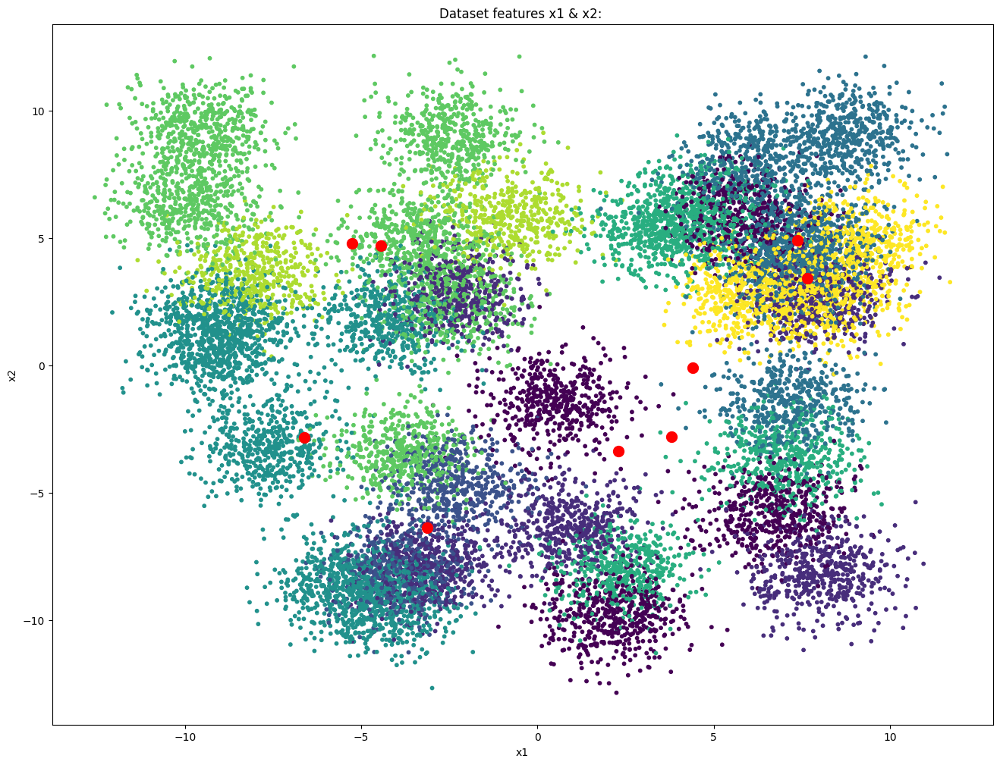

In [19]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_r2'])
plt.scatter(kmeans_r2.cluster_centers_[:, 0], kmeans_r2.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [20]:
labels = kmeans_r2.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [21]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.2777
Calinski-Harabasz Score: 2441.1486
Davies-Bouldin Score: 1.4943


### 3) k-means++ com 300 iterações

In [22]:
kmeans_k1 = KMeans(n_clusters = 11, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_k1.fit(df1)

KMeans(n_clusters=11, n_init=10)

In [23]:
kmeans_k1.cluster_centers_

array([[ 4.15534011e+00,  2.83166194e+00,  2.63892420e-02,
        -2.80872139e+00,  3.90421838e+00, -1.65543672e+00,
        -5.61931154e+00, -1.13717794e+00,  1.11619759e-01,
        -5.52596677e+00,  1.85858829e+00, -5.73833132e+00,
         5.74090683e+00,  5.75186846e+00],
       [ 3.79647727e+00, -2.80570954e+00, -7.99673817e+00,
        -2.70206845e+00, -8.01095166e+00, -6.37105493e-01,
        -1.33955919e+00,  1.94538006e+00,  2.59516441e+00,
        -6.38800603e+00, -2.18663686e+00,  5.72605738e-01,
         1.00000000e+00, -1.06581410e-14],
       [ 4.78950826e+00,  9.60997765e-01, -3.08744622e+00,
         1.48034638e+00, -6.11255082e+00,  3.94519776e+00,
         3.33741023e+00,  1.51859935e+00, -7.48802509e+00,
         6.17478892e+00, -2.53240198e+00, -6.06291979e+00,
         7.24950000e+00,  3.99400000e+00],
       [-6.46259829e+00, -3.63579638e+00,  2.53588554e+00,
        -1.24312708e+00,  5.29965915e+00,  4.77735194e+00,
        -1.84943260e+00,  4.37978277e+00,  6.

In [24]:
labels = kmeans_k1.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_k1'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2,Cluster_k1
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,5,1,10
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,2,6,3
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,2,4,5
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,2,6,5
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,8,5,2


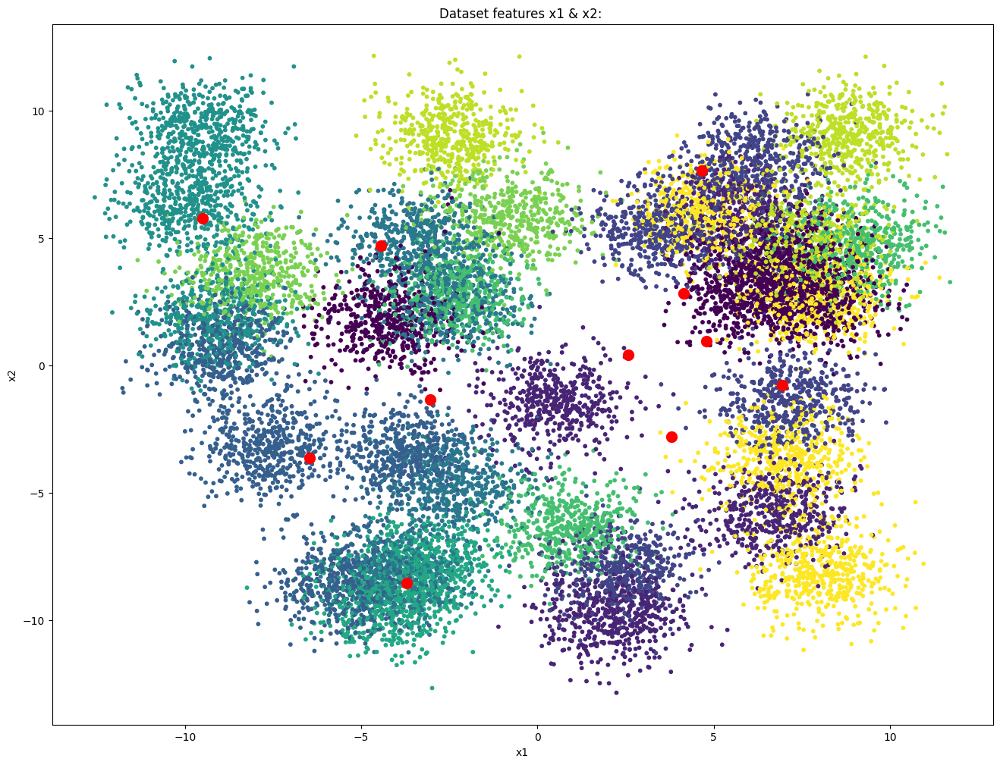

In [25]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_k1'])
plt.scatter(kmeans_k1.cluster_centers_[:, 0], kmeans_k1.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [26]:
labels = kmeans_k1.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [27]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.3423
Calinski-Harabasz Score: 2673.1148
Davies-Bouldin Score: 1.3374


### 4) k-means++ com 1000 iterações

In [28]:
kmeans_k2 = KMeans(n_clusters = 11, init = 'k-means++', n_init = 10, max_iter=1000)
kmeans_k2.fit(df1)

KMeans(max_iter=1000, n_clusters=11, n_init=10)

In [29]:
kmeans_k2.cluster_centers_ 

array([[-8.95423667e-01,  1.75659397e+00,  2.98280433e+00,
         5.64687427e+00,  5.47405936e+00, -2.32270111e+00,
        -6.66926019e+00, -9.01441834e-01, -1.83799362e+00,
        -2.89731549e+00,  5.74939686e+00, -4.77694193e-02,
         3.76211894e+00,  6.49675162e+00,  2.72763618e+00],
       [ 6.73282329e+00,  4.93546537e+00, -5.04893929e-01,
        -1.79777478e+00, -1.66425468e+00, -8.90866824e-01,
        -1.24253819e+00,  3.27461976e+00, -6.88315646e+00,
        -1.55476174e+00, -1.75604433e+00, -7.32551507e+00,
         7.19935820e+00,  5.39029282e+00,  2.20457280e+00],
       [-3.13716086e+00, -7.80889926e+00,  8.43131420e+00,
         7.51862917e+00, -4.78912462e+00,  3.25089629e+00,
         6.29745863e+00,  1.11756776e+00,  6.17431849e-01,
        -5.19005531e+00, -8.10603282e+00,  7.98772424e+00,
         4.00000000e+00,  1.00000000e+00,  6.00000000e+00],
       [ 4.66951983e+00,  7.63544376e+00,  5.63455480e+00,
         1.13942496e+00, -6.45541408e+00, -8.28488904

In [30]:
labels = kmeans_k2.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_k2'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2,Cluster_k1,Cluster_k2
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,5,1,10,10
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,2,6,3,0
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,2,4,5,6
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,2,6,5,6
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,8,5,2,9


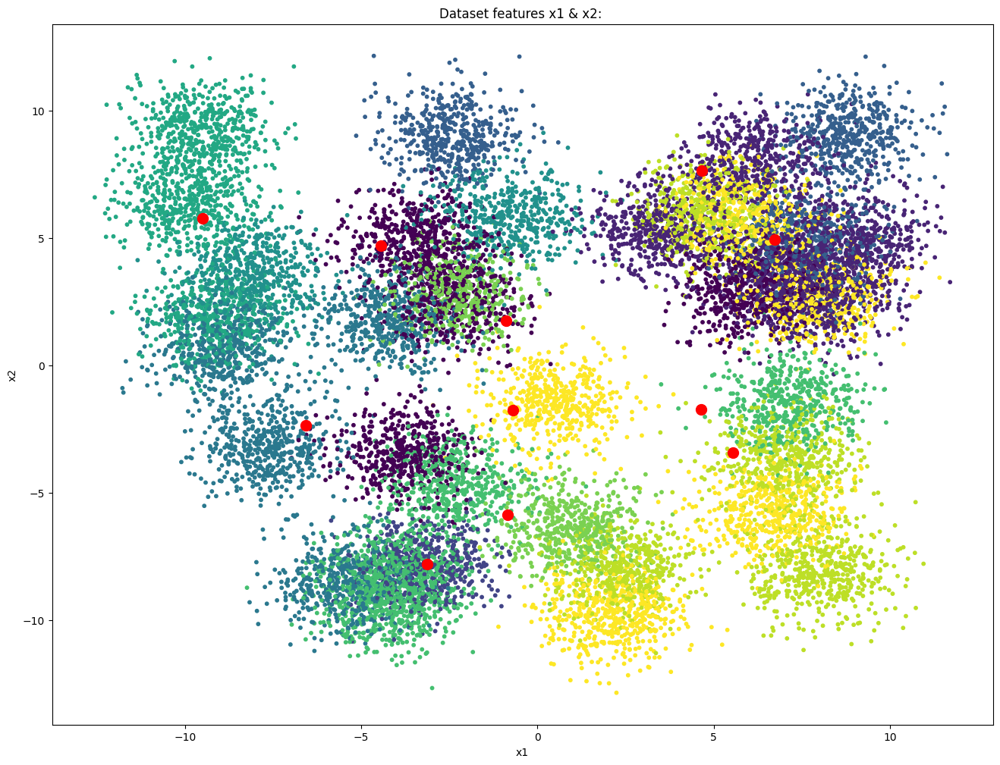

In [31]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_k2'])
plt.scatter(kmeans_k2.cluster_centers_[:, 0], kmeans_k2.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

validacao da eficácia



In [32]:
labels = kmeans_k2.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [33]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.3392
Calinski-Harabasz Score: 2728.5480
Davies-Bouldin Score: 1.2624


## Dataset 2

In [34]:
#Impotando dataset 1
df2 = pd.read_csv('Dataset/dataset_2.csv', sep=';')
#Examinando Data Type
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108500 entries, 0 to 108499
Data columns (total 12 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   x1      108500 non-null  float64
 1   x2      108500 non-null  float64
 2   x3      108500 non-null  float64
 3   x4      108500 non-null  float64
 4   x5      108500 non-null  float64
 5   x6      108500 non-null  float64
 6   x7      108500 non-null  float64
 7   x8      108500 non-null  float64
 8   x9      108500 non-null  float64
 9   x10     108500 non-null  float64
 10  x11     108500 non-null  float64
 11  x12     108500 non-null  float64
dtypes: float64(12)
memory usage: 9.9 MB


In [35]:
#Verificando os primeiros 5 registros
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676


In [36]:
#Verificando dados nulos
df2.isna().sum()

x1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
dtype: int64

In [37]:
#Examinando características gerais do dados
df1.describe()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2,Cluster_k1,Cluster_k2
count,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000
mean,0.479316,0.401101,-0.036613,0.115756,-0.067300,-0.050764,-0.356024,1.258355,-1.014831,-0.419818,-0.292423,-1.619202,4.027027,3.836000,4.620162,5.136378
std,6.162037,5.936852,5.929547,5.288724,6.450516,5.489512,5.701534,5.882630,6.187764,6.374784,5.910394,5.935993,2.487620,2.410161,3.267419,3.410164
min,-12.562877,-12.845130,-13.184632,-12.684910,-13.220067,-12.976295,-13.168605,-11.877164,-12.944935,-12.986817,-12.595942,-12.920032,0.000000,0.000000,0.000000,0.000000
25%,-4.163954,-4.969523,-5.410800,-3.845578,-5.982486,-4.613177,-5.641036,-4.064888,-6.869708,-6.034305,-4.583072,-6.524806,2.000000,2.000000,2.000000,2.000000
50%,0.246958,2.038327,0.719043,0.942982,0.129550,0.092994,-0.203821,1.712891,-1.486036,-0.639076,-1.030882,-2.586011,3.000000,4.000000,4.000000,5.000000
75%,6.534062,5.094108,4.827765,4.285728,5.821847,4.081665,3.813254,6.672852,4.271135,5.006888,4.065448,2.599988,6.000000,6.000000,7.000000,8.000000
max,11.706389,12.152035,12.156041,11.984369,12.624881,12.034950,12.643021,12.347370,12.334277,13.073007,12.721117,12.397334,8.000000,8.000000,10.000000,10.000000


# Definindo o número de Cluster utilizando o método Elbow
## Dataset 2
###  1) random

/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


1 45193158.973791316
2 41722569.34493804


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


3 39241230.70521739


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


4 37239029.909777075


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


5 35607678.59106794


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


6 34164538.61764665


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


7 32802370.709034894


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


8 31865355.34729659


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 30938178.29668924


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


10 30223285.488903165


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


11 29378849.05518593


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


12 28684274.75713271


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


13 27929362.91157216


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


14 27377018.399077542


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


15 26689822.112791393


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 26110110.666711956


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


17 25563753.246790703


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


18 25127808.889826532


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


19 24719211.294353087


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


20 24467218.26971747


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


21 23930564.96399944


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


22 23269420.75416312


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


23 23180661.58236784


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


24 22693844.7595228


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


25 22654210.772302777


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


26 22062769.38247064


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 21717586.773579292


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


28 21536675.140623674


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 21098128.92918174


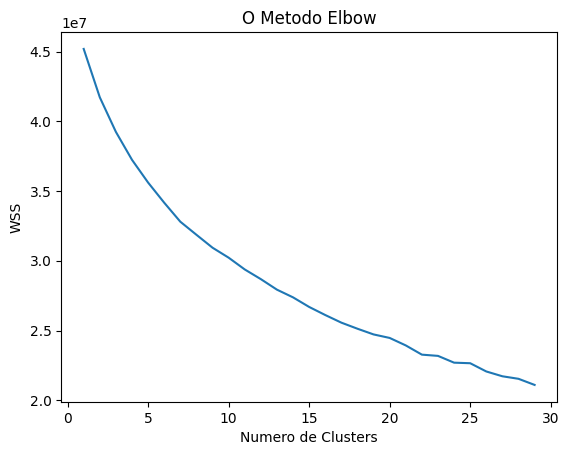

In [38]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss2 = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 30):
    kmeans2_2 = KMeans(n_clusters = i, init = 'random')
    kmeans2_2.fit(df2)
    print (i,kmeans2_2.inertia_)
    wcss2.append(kmeans2_2.inertia_)

plt.plot(range(1, 30), wcss2)
plt.title('O Metodo Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()


In [39]:
wcss2

[45193158.973791316,
 41722569.34493804,
 39241230.70521739,
 37239029.909777075,
 35607678.59106794,
 34164538.61764665,
 32802370.709034894,
 31865355.34729659,
 30938178.29668924,
 30223285.488903165,
 29378849.05518593,
 28684274.75713271,
 27929362.91157216,
 27377018.399077542,
 26689822.112791393,
 26110110.666711956,
 25563753.246790703,
 25127808.889826532,
 24719211.294353087,
 24467218.26971747,
 23930564.96399944,
 23269420.75416312,
 23180661.58236784,
 22693844.7595228,
 22654210.772302777,
 22062769.38247064,
 21717586.773579292,
 21536675.140623674,
 21098128.92918174]

## 2)Kmeans++

/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


1 58442004.670436375


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2 51905373.35878979


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


3 48519698.95403653


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


4 45665646.42190969


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


5 43598742.548840456


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


6 41539126.61218806


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


7 39820998.16235376


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


8 38104193.781043895


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 36443988.51932074


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


10 35069401.7531586


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


11 33948378.81855112


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


12 32721516.4073304


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


13 31811039.59145997


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


14 30720318.1080629


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


15 29898219.938011575


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 28883626.18393185


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


17 28205071.293642975


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


18 27464717.31474354


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


19 26803130.95057564


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


20 26084084.930941556


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


21 25434651.761433013


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


22 24677393.41150064


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


23 24606110.347277734


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


24 24220224.011285312


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


25 23819761.20692834


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


26 23297135.5501874


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 22823296.338843808


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


28 22523392.21826856


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 22155252.86827915


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


30 21812105.255139805


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


31 21734729.61226512


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


32 21479458.522261422


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


33 21094396.227907058


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


34 20878891.467260204


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


35 20346640.919515453


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


36 20435568.089729413


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


37 20131993.77319134


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


38 19733092.265031632


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


39 19540135.88179938


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


40 19409233.336530376


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


41 19176998.099316612


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


42 18787581.084930602


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


43 18740432.08463866


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


44 18335377.75084936


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


45 18339590.375939008


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


46 18182573.342252187


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


47 17975207.3716419


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


48 17769703.77391527


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


49 17497040.54781398


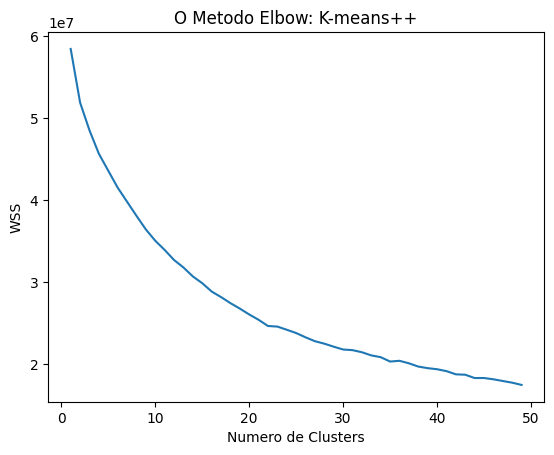

In [73]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_22 = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 50):
    kmeans2_2 = KMeans(n_clusters = i, init = 'k-means++')
    kmeans2_2.fit(df2)
    print (i,kmeans2_2.inertia_)
    wcss_22.append(kmeans2_2.inertia_)

plt.plot(range(1, 50), wcss_22)
plt.title('O Metodo Elbow: K-means++')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

In [41]:
wcss_22

[45193158.9737913,
 41722148.70602051,
 39269135.569300495,
 37199851.35049192,
 35510965.54742262,
 34010602.239842415,
 32875911.957217738,
 31903177.493257716,
 31055704.419181157,
 30095836.296743844,
 29474758.673090532,
 28585685.319452982,
 28020947.331734907,
 27454765.79791798,
 26659353.380301956,
 26170767.782624204,
 25467155.879143614,
 25258165.69175287,
 24713986.494887516,
 24248802.577803835,
 23909152.925574064,
 23487999.300320916,
 23206416.553395946,
 22574051.621269144,
 22365937.37841246,
 21995191.169472408,
 21658998.349458076,
 21582369.60693806,
 20961710.89004325]

# Instânciando o Algoritmo K-means 
## Dataset 2
### 1) random com 300 iterações

In [62]:
kmeans_r21 = KMeans(n_clusters = 25, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_r21.fit(df2)

KMeans(n_clusters=25, n_init=10)

In [64]:
labels = kmeans_r21.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_r21'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21,Cluster_k22
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,6,3,10,5
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,11,1,9,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,0,0,3
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,14,0,3,7
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,18,5,6,2


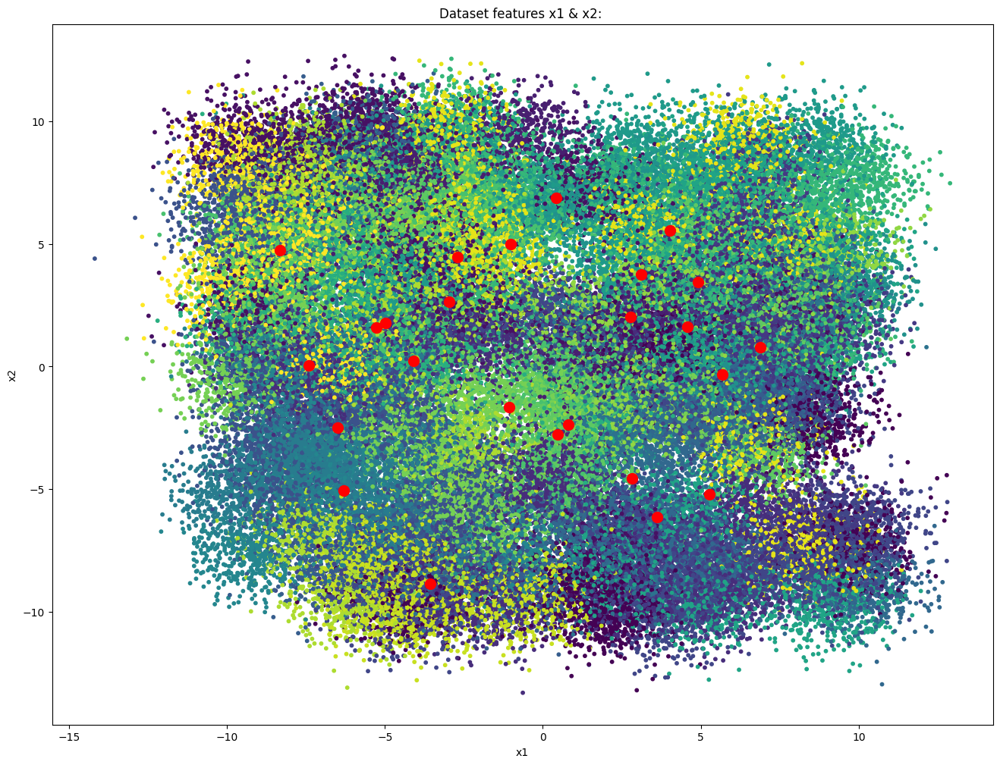

In [65]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_r21'])
plt.scatter(kmeans_r21.cluster_centers_[:, 0], kmeans_r21.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [66]:
labels = kmeans_r21.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [67]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.2199
Calinski-Harabasz Score: 5971.5872
Davies-Bouldin Score: 1.6090


### 2) random com 1000 iterações

In [68]:
kmeans_r22 = KMeans(n_clusters = 25, init = 'random', n_init = 10, max_iter=1000)
kmeans_r22.fit(df2)

KMeans(init='random', max_iter=1000, n_clusters=25, n_init=10)

In [69]:
labels = kmeans_r22.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_r22'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21,Cluster_k22
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,6,17,10,5
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,11,9,9,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,22,0,3
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,14,14,3,7
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,18,15,6,2


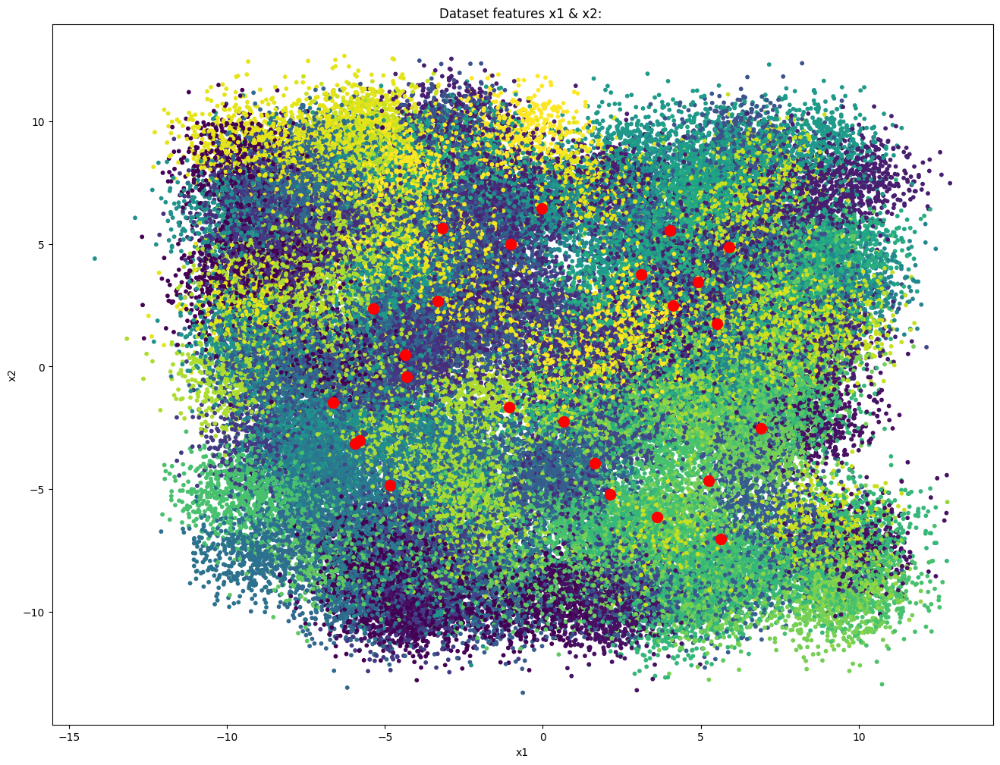

In [70]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_r22'])
plt.scatter(kmeans_r22.cluster_centers_[:, 0], kmeans_r22.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [71]:
labels = kmeans_r22.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [72]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.2429
Calinski-Harabasz Score: 6823.4286
Davies-Bouldin Score: 1.5239


### 3) k-means++ com 300 iterações

In [52]:
kmeans_k21 = KMeans(n_clusters = 11, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_k21.fit(df2)

KMeans(n_clusters=11, n_init=10)

In [53]:
labels = kmeans_k21.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_k21'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,0,3,10
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,8,1,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,0,0
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,3,0,3
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,2,5,6


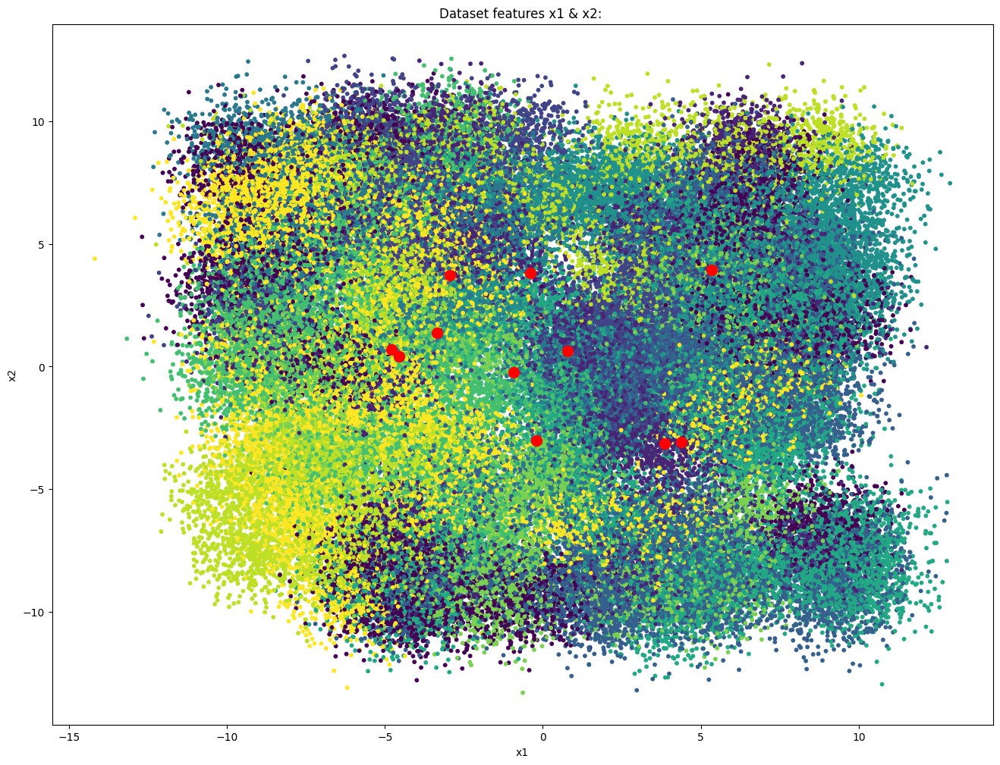

In [54]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_k21'])
plt.scatter(kmeans_k21.cluster_centers_[:, 0], kmeans_k21.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [55]:
labels = kmeans_k21.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [56]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.1411
Calinski-Harabasz Score: 6709.5427
Davies-Bouldin Score: 2.0326


### 4) k-means++ com 1000 iterações

In [57]:
kmeans_k22 = KMeans(n_clusters = 11, init = 'k-means++', n_init = 10, max_iter=1000)
kmeans_k22.fit(df2)

KMeans(max_iter=1000, n_clusters=11, n_init=10)

In [58]:
labels = kmeans_k22.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_k22'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21,Cluster_k22
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,0,3,10,5
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,8,1,9,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,0,0,3
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,3,0,3,7
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,2,5,6,2


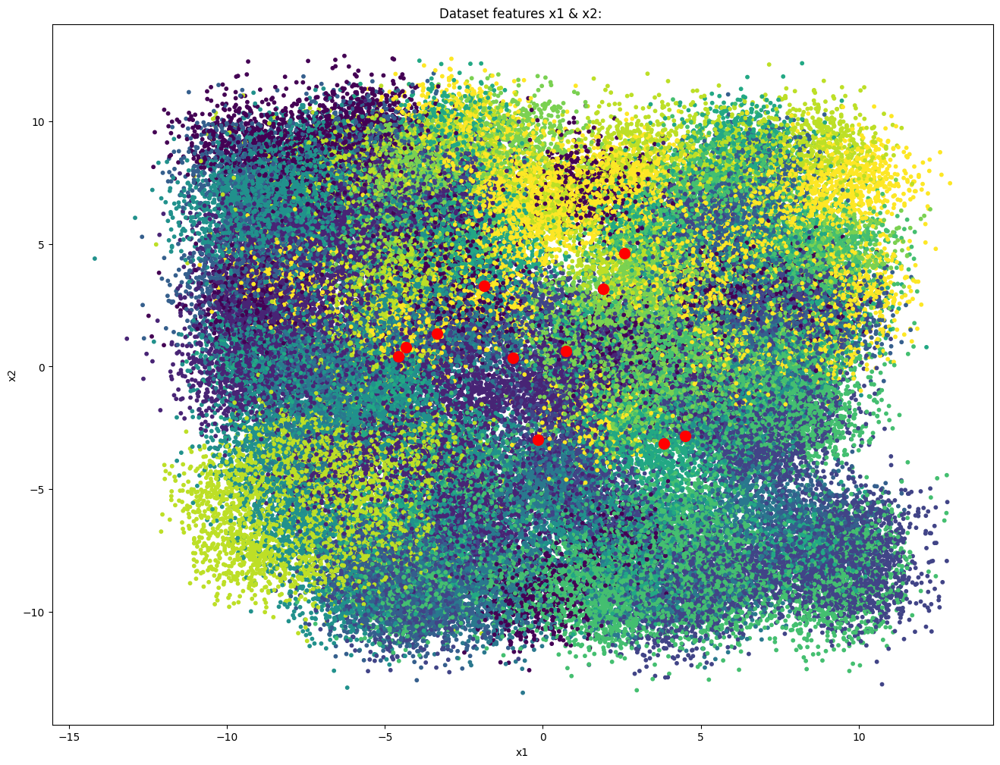

In [59]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_k22'])
plt.scatter(kmeans_k22.cluster_centers_[:, 0], kmeans_k22.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [60]:
labels = kmeans_k22.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [61]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.1555
Calinski-Harabasz Score: 7025.0857
Davies-Bouldin Score: 1.9003
